# A. Cluster your data

In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import numpy as np
import seaborn as sns
from scipy import stats
from sklearn.cluster import KMeans, DBSCAN
from collections import Counter
from sklearn import metrics
from scipy.spatial.distance import cdist 
from sklearn.preprocessing import normalize
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.preprocessing import MinMaxScaler
import statsmodels.api as sm
from sklearn import preprocessing
from sklearn import linear_model
from sklearn.cross_validation import train_test_split
from sklearn.linear_model import LogisticRegression, Lasso, Ridge, ElasticNet, SGDRegressor
from sklearn.cross_validation import KFold,cross_val_score,train_test_split
from sklearn.linear_model import LinearRegression

G:\Anaconda\lib\site-packages\statsmodels\compat\pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools
G:\Anaconda\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


# Data Cleaning 

In [2]:
plt.rcParams['figure.figsize'] = (10,8)
df = pd.read_csv("billboard.csv")

print(df.head())

print(df.shape)

        title                               artist  weeks  rank  popularity  \
0  God's Plan                                Drake      3     1         100   
1     Perfect                           Ed Sheeran     24     2          98   
2     Finesse                 Bruno Mars & Cardi B      6     3          98   
3      Havana  Camila Cabello Featuring Young Thug     26     4          98   
4    Rockstar      Post Malone Featuring 21 Savage     21     5          95   

   danceability  energy  key  loudness  mode  speechiness  acousticness  \
0         0.753   0.454    7    -9.488     1       0.0963        0.0244   
1         0.599   0.448    8    -6.312     1       0.0232        0.1630   
2         0.704   0.859    5    -4.877     0       0.0996        0.0185   
3         0.765   0.523    2    -4.333     1       0.0300        0.1840   
4         0.580   0.531    5    -6.631     0       0.0776        0.1280   

   instrumentalness  liveness  valence    tempo speech        date  
0    

In [3]:
df.describe()

,weeks,rank,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,10899.000000,10899.000000,10899.000000,10899.000000,10899.000000,10899.000000,10899.000000,10899.000000,10899.000000,10899.000000,10899.000000,10899.000000,10899.000000,10899.000000
mean,12.303789,50.498853,78.708781,0.676373,0.636500,5.419855,-6.289472,0.606478,0.118117,0.173049,0.004505,0.159491,0.481490,119.101830
std,9.912135,28.868470,9.522292,0.137056,0.160687,3.692318,2.220989,0.488553,0.110340,0.195173,0.031012,0.110272,0.212105,28.863927
min,1.000000,1.000000,0.000000,0.000000,0.000020,0.000000,-16.998000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.000000,25.500000,74.000000,0.591000,0.532000,1.000000,-7.390000,0.000000,0.043200,0.029300,0.000000,0.094000,0.319000,95.252000
50%,10.000000,50.000000,79.000000,0.677000,0.641000,6.000000,-5.862000,1.000000,0.070000,0.096900,0.000000,0.119000,0.473000,117.020000
75%,17.000000,75.500000,85.000000,0.769000,0.767000,9.000000,-4.804000,1.000000,0.145000,0.243000,0.000007,0.179000,0.648000,140.053000
max,57.000000,100.000000,100.000000,0.981000,0.989000,11.000000,-1.075000,1.000000,0.765000,0.968000,0.852000,0.919000,0.966000,202.082000


In [4]:
df.duplicated().sum()

900

In [5]:
df=df.drop_duplicates()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9999 entries, 0 to 10898
Data columns (total 18 columns):
title               9999 non-null object
artist              9999 non-null object
weeks               9999 non-null int64
rank                9999 non-null int64
popularity          9999 non-null int64
danceability        9999 non-null float64
energy              9999 non-null float64
key                 9999 non-null int64
loudness            9999 non-null float64
mode                9999 non-null int64
speechiness         9999 non-null float64
acousticness        9999 non-null float64
instrumentalness    9999 non-null float64
liveness            9999 non-null float64
valence             9999 non-null float64
tempo               9999 non-null float64
speech              9999 non-null object
date                9999 non-null object
dtypes: float64(9), int64(5), object(4)
memory usage: 1.4+ MB


In [6]:
df_bak=df.copy()

In [7]:
columns=['title','artist','weeks','rank','instrumentalness','speech','date']
df_bak = df_bak.drop(columns, axis=1)

In [8]:
df_bak.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9999 entries, 0 to 10898
Data columns (total 11 columns):
popularity      9999 non-null int64
danceability    9999 non-null float64
energy          9999 non-null float64
key             9999 non-null int64
loudness        9999 non-null float64
mode            9999 non-null int64
speechiness     9999 non-null float64
acousticness    9999 non-null float64
liveness        9999 non-null float64
valence         9999 non-null float64
tempo           9999 non-null float64
dtypes: float64(8), int64(3)
memory usage: 937.4 KB


In [9]:
df_bak.duplicated().sum()

8999

In [10]:
df_bak=df_bak.drop_duplicates()


#plt.plot(df_bak['danceability'])

In [11]:
df_bak.isnull().sum()

popularity      0
danceability    0
energy          0
key             0
loudness        0
mode            0
speechiness     0
acousticness    0
liveness        0
valence         0
tempo           0
dtype: int64

In [12]:
df_bak.describe()
df_bak.info()
print(df_bak)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 10897
Data columns (total 11 columns):
popularity      1000 non-null int64
danceability    1000 non-null float64
energy          1000 non-null float64
key             1000 non-null int64
loudness        1000 non-null float64
mode            1000 non-null int64
speechiness     1000 non-null float64
acousticness    1000 non-null float64
liveness        1000 non-null float64
valence         1000 non-null float64
tempo           1000 non-null float64
dtypes: float64(8), int64(3)
memory usage: 93.8 KB
       popularity  danceability  energy  key  loudness  mode  speechiness  \
0             100         0.753   0.454    7    -9.488     1       0.0963   
1              98         0.599   0.448    8    -6.312     1       0.0232   
2              98         0.704   0.859    5    -4.877     0       0.0996   
3              98         0.765   0.523    2    -4.333     1       0.0300   
4              95         0.580   0.531    5

## distribution

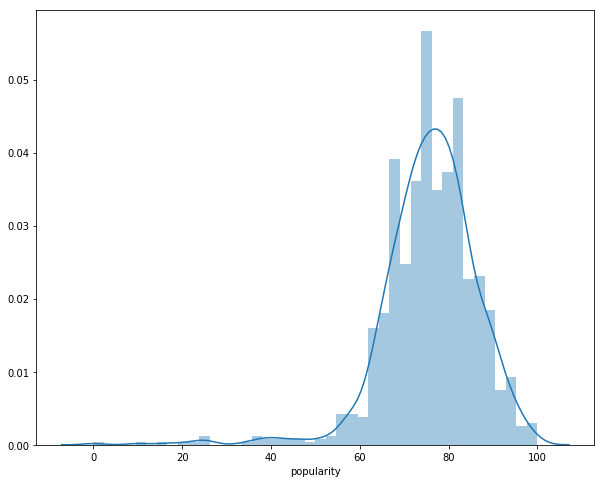

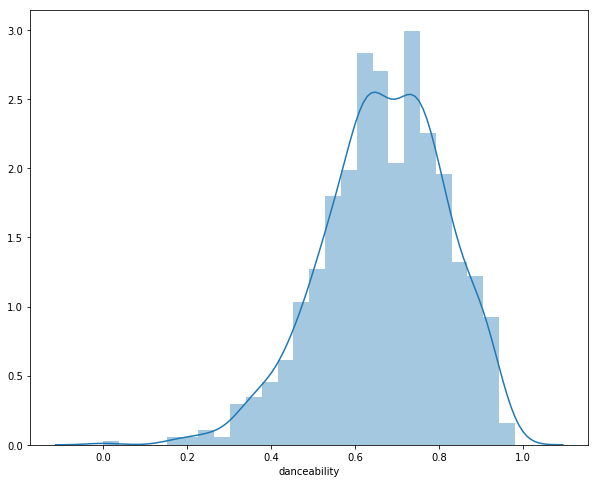

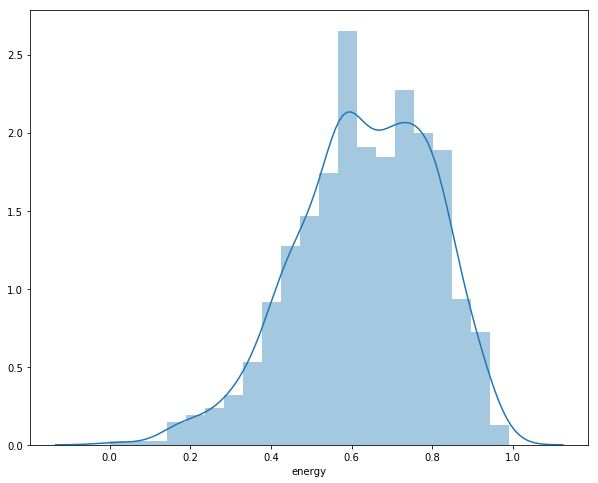

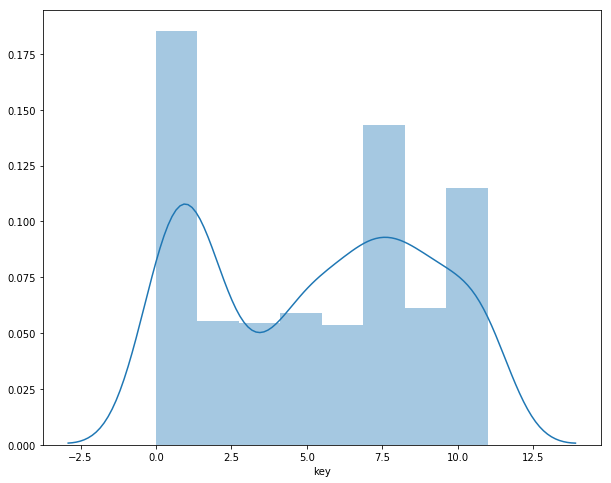

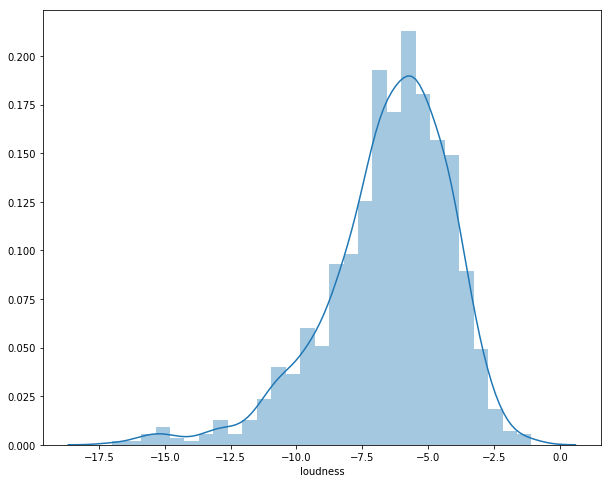

...

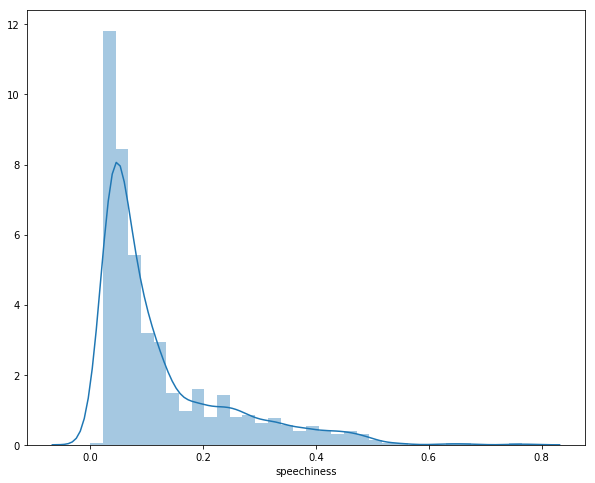

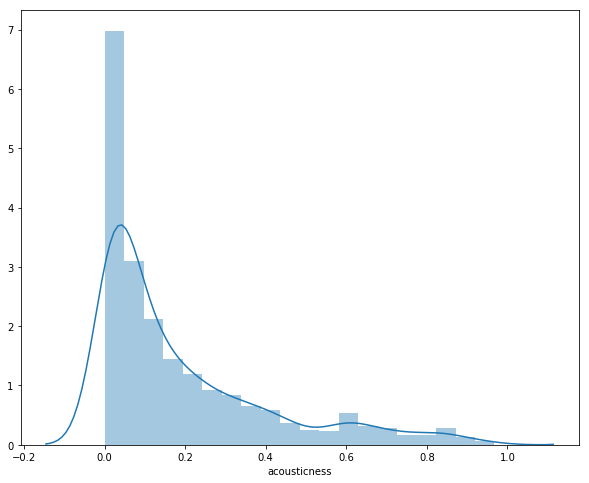

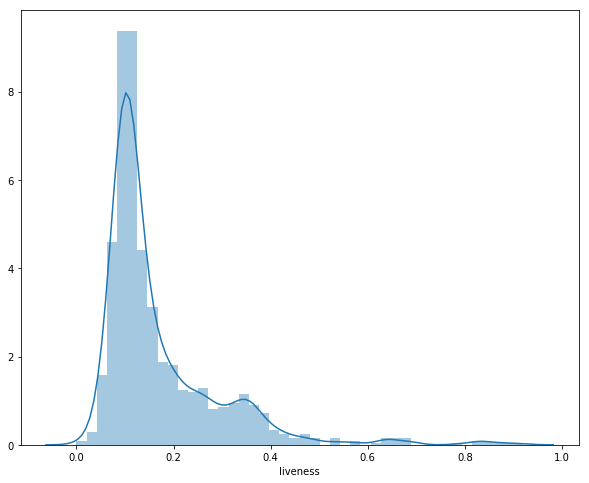

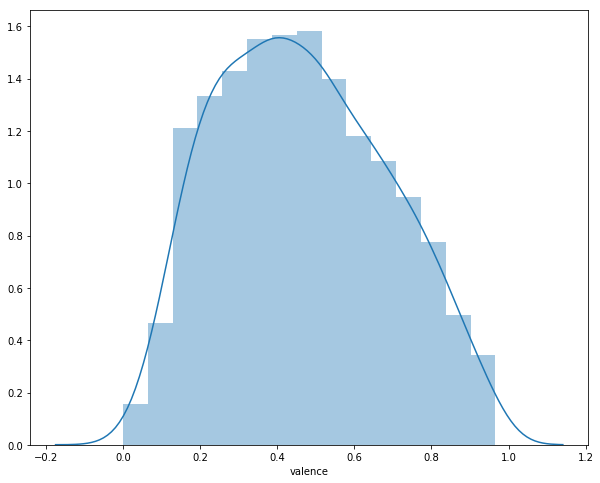

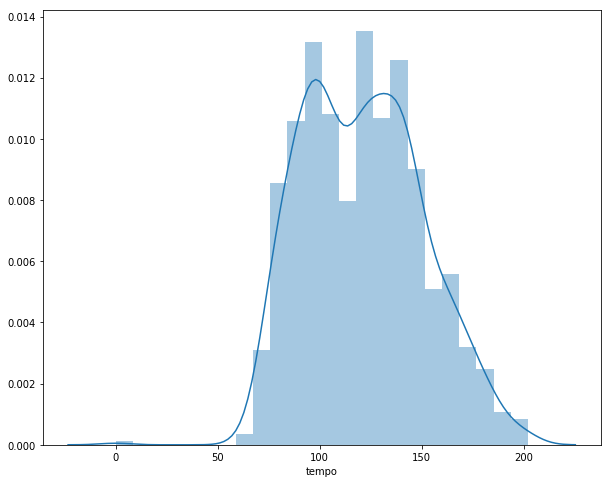

In [13]:
def show_distribution(df):
    for col in list(df.columns.values):
        sns.distplot(df[col])
        plt.show()
        
show_distribution(df_bak)


## Cluster

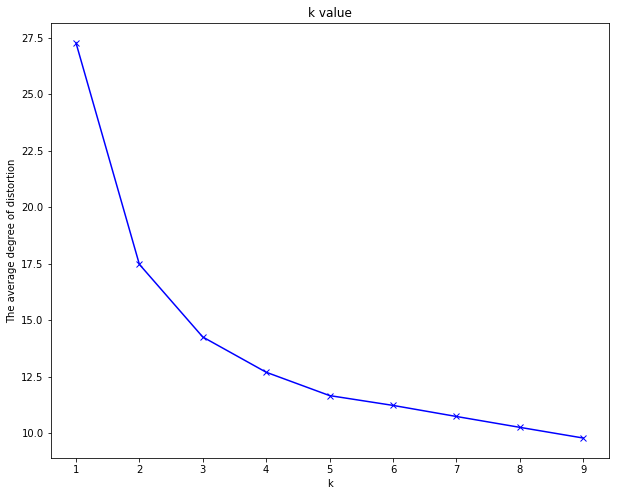

In [14]:
K = range(1, 10)  
meandistortions = [] 
for k in K:  
    kmeans = KMeans(n_clusters=k)  
    kmeans.fit(df_bak)  
    meandistortions.append(sum(np.min(cdist(df_bak, kmeans.cluster_centers_, 'euclidean'), axis=1)) / df_bak.shape[0])
plt.plot(K, meandistortions, 'bx-')  
plt.xlabel('k')  
plt.ylabel('The average degree of distortion')  
plt.title('k value'); 

#  No Scaling

### KMeans k =2

In [15]:
model = KMeans(n_clusters = 2, n_jobs = 4,max_iter=500)
model.fit(df_bak)
labels = model.labels_
#metrics.calinski_harabaz_score(data_zs,labels) 
metrics.silhouette_score(df_bak,labels,metric='euclidean')

0.49190916671591395

In [16]:
r1 = pd.Series(model.labels_).value_counts()
r2 = pd.DataFrame(model.cluster_centers_)
r = pd.concat([r2,r1],axis = 1)
r.columns = list(df_bak.columns)+["num"]
print(r)

   popularity  danceability    energy       key  loudness      mode  \
0   75.770398      0.664649  0.624886  5.347249 -6.502078  0.607211   
1   75.758985      0.673264  0.639866  5.312896 -6.504391  0.623679   

   speechiness  acousticness  liveness   valence       tempo  num  
0     0.106647      0.202681  0.161292  0.476292   98.291698  527  
1     0.140582      0.174497  0.179131  0.453912  146.805378  473  


Counter({0: 527, 1: 473})

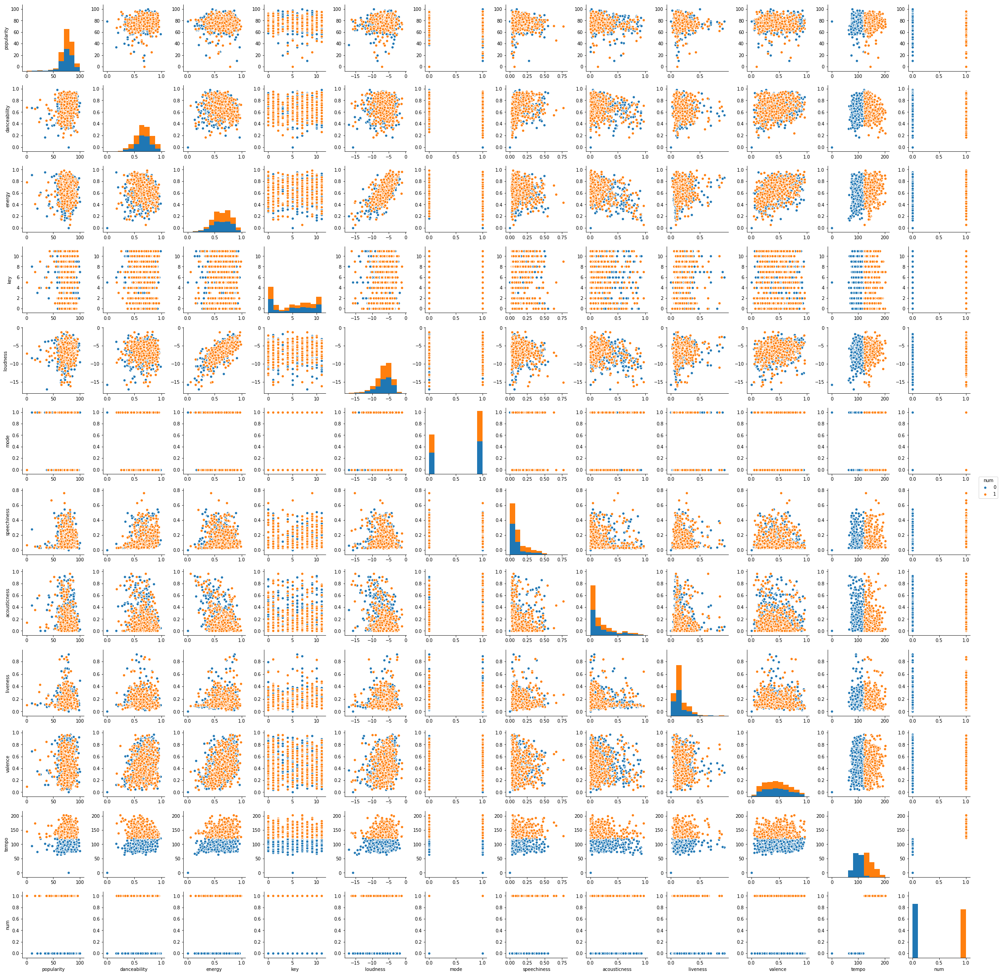

In [17]:
r = pd.concat([df_bak,pd.Series(model.labels_,index=df_bak.index)],axis=1)
r.columns=list(df_bak.columns)+["num"]
sns.pairplot(r,hue="num")
Counter(r['num'])

## After Scaling

1464.05696295
0.517127036889


Counter({0: 405, 1: 595})

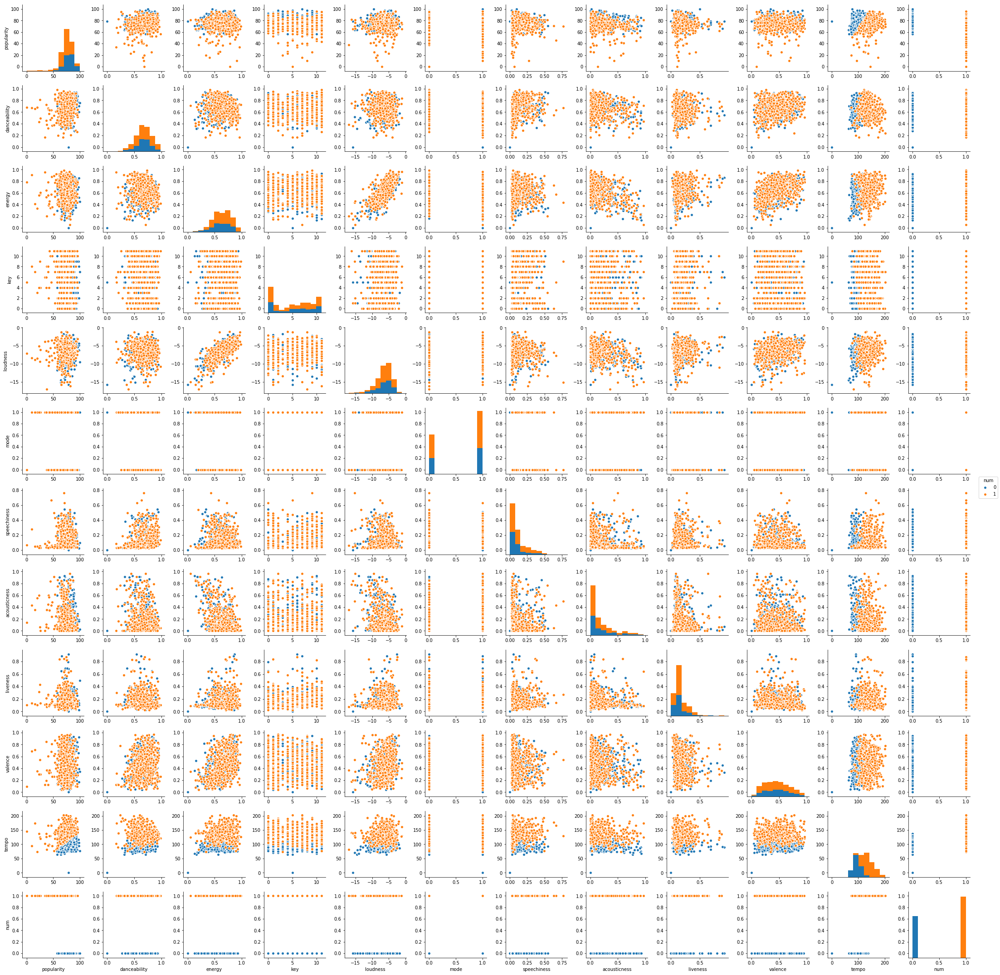

In [18]:
data = df_bak
data_zs = preprocessing.normalize(data, norm='l2')
data_zs = pd.DataFrame(data_zs)
data_zs.columns=list(data.columns)

model = KMeans(n_clusters = 2, n_jobs = 4,max_iter=500)
model.fit(data_zs)
labels = model.labels_
print(metrics.calinski_harabaz_score(data_zs,labels) )
print(metrics.silhouette_score(data_zs,labels,metric='euclidean'))

r = pd.concat([data,pd.Series(model.labels_,index=data.index)],axis=1)
r.columns=list(data.columns)+["num"]
sns.pairplot(r,hue="num")
Counter(r['num'])

### DBSCAN
#### eps = 0.02

In [19]:
db = DBSCAN(eps=5, min_samples=10).fit(df_bak)
labels = db.labels_
print(Counter(labels))

Counter({0: 562, -1: 345, 1: 45, 3: 11, 6: 10, 4: 9, 2: 9, 5: 9})


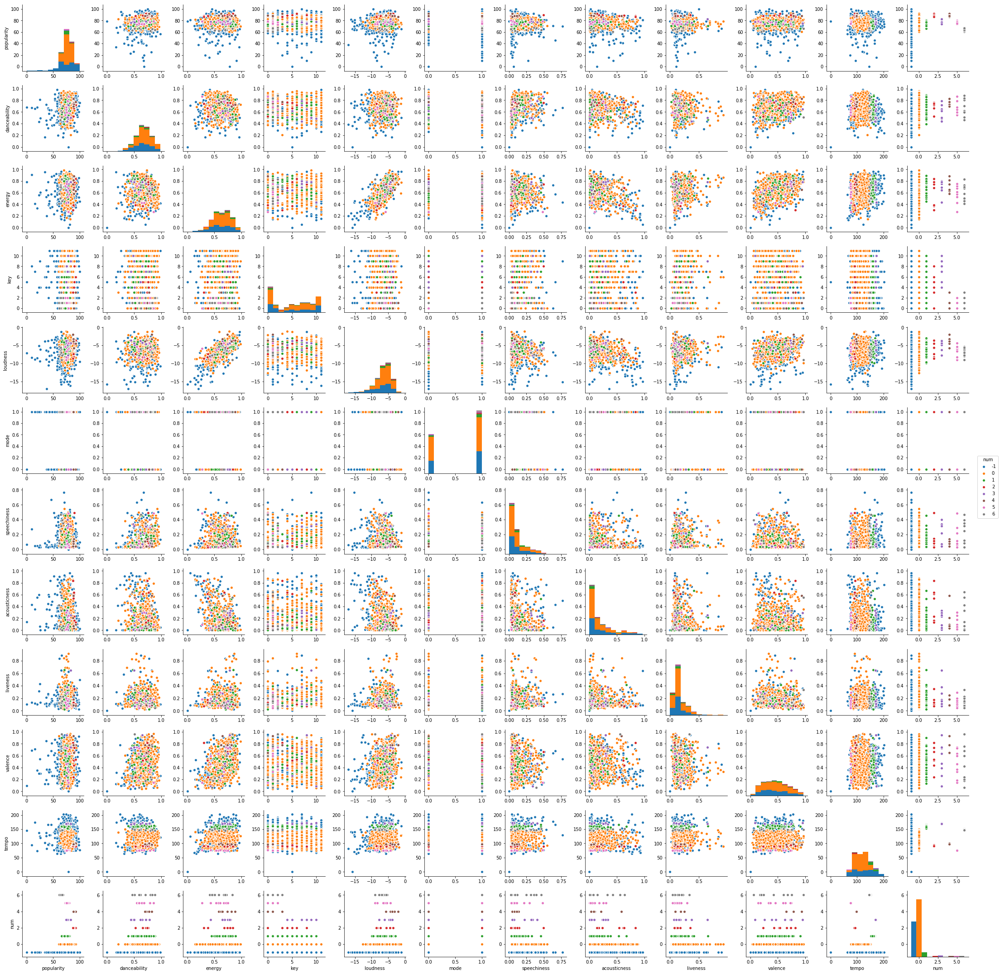

In [20]:
r = pd.concat([df_bak,pd.Series(labels,index=df_bak.index)],axis=1)
r.columns=list(df_bak.columns)+["num"]
sns.pairplot(r,hue="num")

# normalization

## 1.Min-max normalization

In [21]:
data = df_bak
scaler = MinMaxScaler()
scaler.fit(data)
data_zs=scaler.transform(data)
#data_zs = 1.0*(data - data.mean())/data.std()
data_zs= pd.DataFrame(data_zs)
data_zs.columns = list(data.columns)
data_zs.describe()

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,liveness,valence,tempo
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,0.757650,0.681676,0.638993,0.484636,0.659099,0.615000,0.160390,0.195610,0.184690,0.482097,0.599948
std,0.107967,0.149352,0.170100,0.331297,0.148912,0.486839,0.150659,0.225459,0.135790,0.226530,0.144206
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.700000,0.590214,0.529566,0.090909,0.584108,0.000000,0.056830,0.030243,0.103319,0.297101,0.483076
50%,0.760000,0.687054,0.648628,0.545455,0.678201,1.000000,0.098627,0.103822,0.130577,0.467909,0.593987
75%,0.820000,0.786952,0.771734,0.727273,0.761336,1.000000,0.204902,0.284866,0.218988,0.653209,0.697686
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


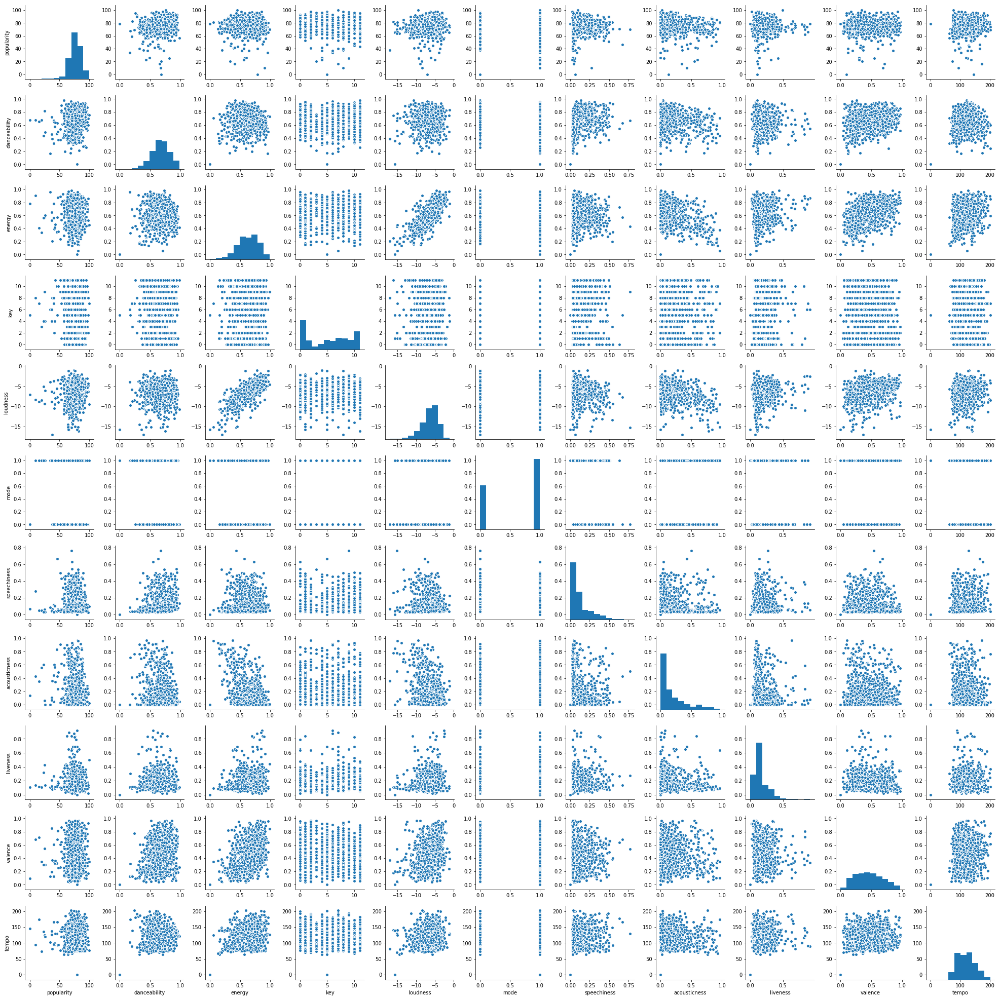

In [22]:
sns.pairplot(df_bak)

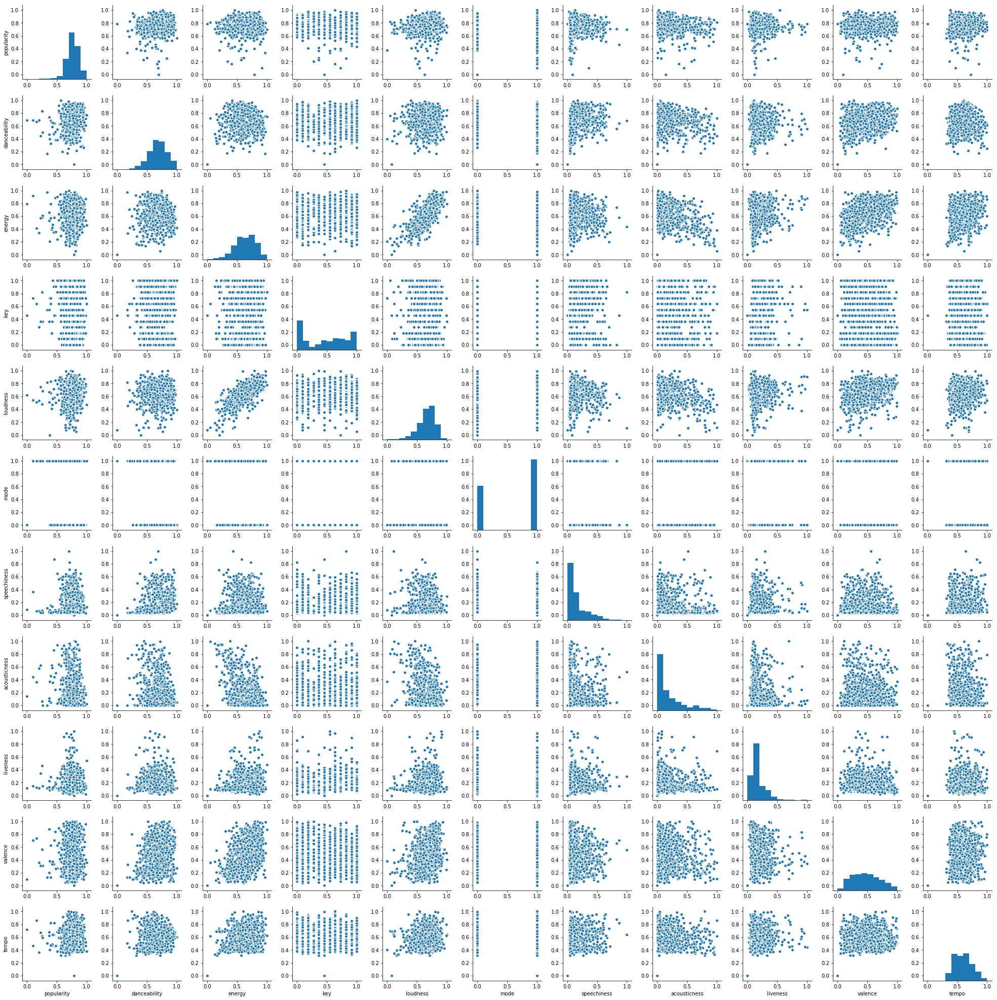

In [23]:
sns.pairplot(data_zs)

## 2.Standardization

In [24]:
data = df_bak
scaler = preprocessing.StandardScaler() 
data_zs = scaler.fit_transform(data)  
data_zs = pd.DataFrame(data_zs)
data_zs.columns=list(data.columns)
data_zs.describe()


,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,liveness,valence,tempo
count,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03,1.000000e+03
mean,2.773337e-16,5.295764e-17,5.604406e-16,-8.404388e-17,1.393746e-16,3.994582e-16,1.223466e-16,1.387779e-17,-5.984102e-17,-4.092907e-17,4.256595e-16
std,1.000500e+00,1.000500e+00,1.000500e+00,1.000500e+00,1.000500e+00,1.000500e+00,1.000500e+00,1.000500e+00,1.000500e+00,1.000500e+00,1.000500e+00
min,-7.020945e+00,-4.566521e+00,-3.758454e+00,-1.463576e+00,-4.428318e+00,-1.263884e+00,-1.065122e+00,-8.680411e-01,-1.360789e+00,-2.129246e+00,-4.162448e+00
25%,-5.342275e-01,-6.126991e-01,-6.436343e-01,-1.189035e+00,-5.038441e-01,-1.263884e+00,-6.877231e-01,-7.338353e-01,-5.995382e-01,-8.170587e-01,-8.108579e-01
50%,2.177684e-02,3.602827e-02,5.666947e-02,1.836676e-01,1.283461e-01,7.912119e-01,-4.101539e-01,-4.073175e-01,-3.987028e-01,-6.266539e-02,-4.135952e-02
75%,5.777812e-01,7.052417e-01,7.807627e-01,7.327486e-01,6.869056e-01,7.912119e-01,2.955966e-01,3.960836e-01,2.527095e-01,7.557370e-01,6.781075e-01
max,2.245794e+00,2.132442e+00,2.123383e+00,1.556370e+00,2.290430e+00,7.912119e-01,5.575704e+00,3.569575e+00,6.007185e+00,2.287384e+00,2.775568e+00


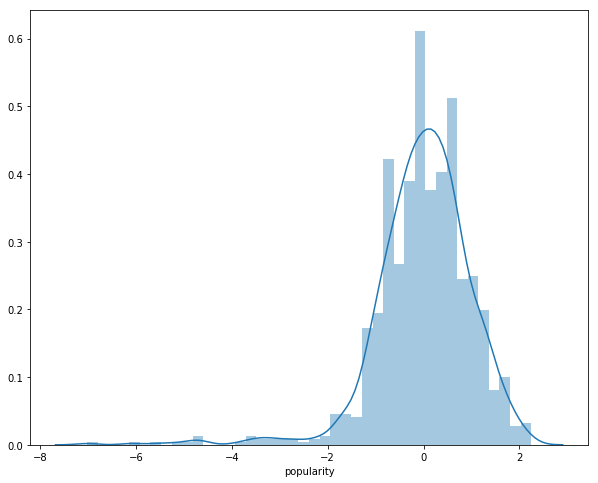

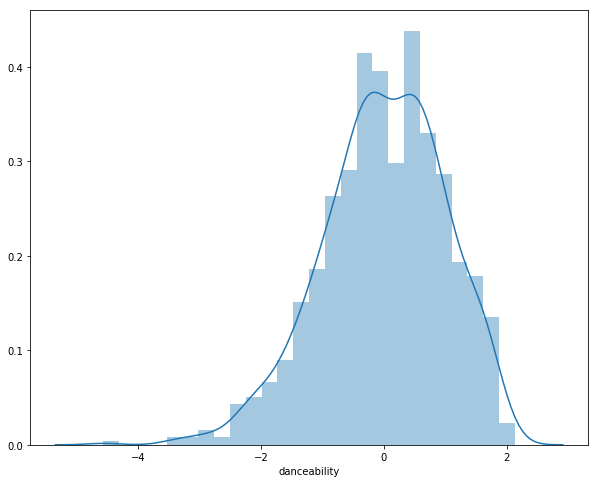

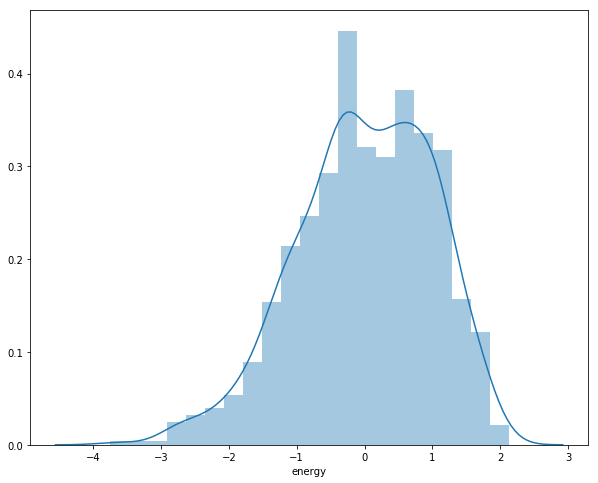

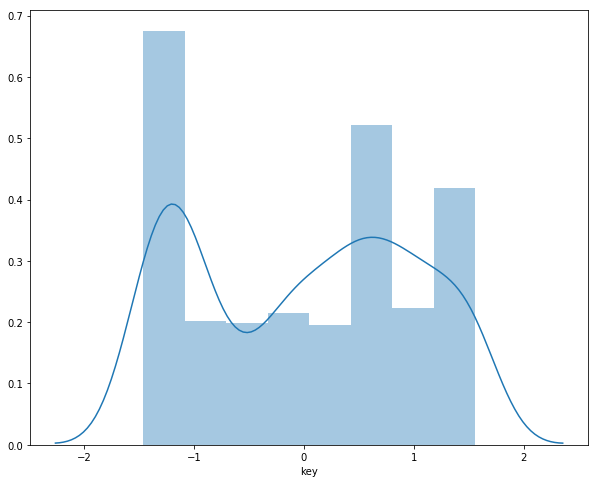

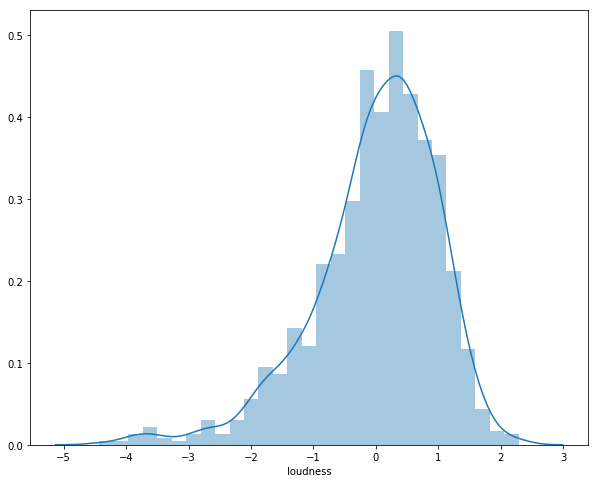

...

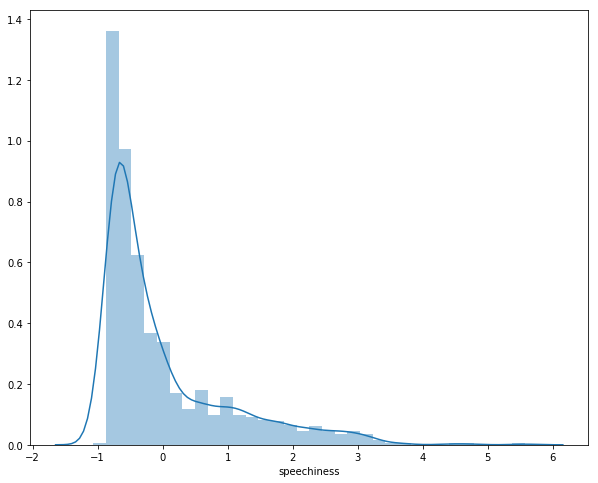

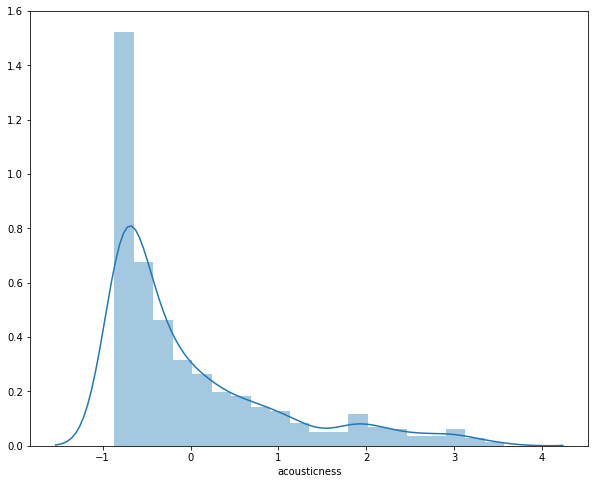

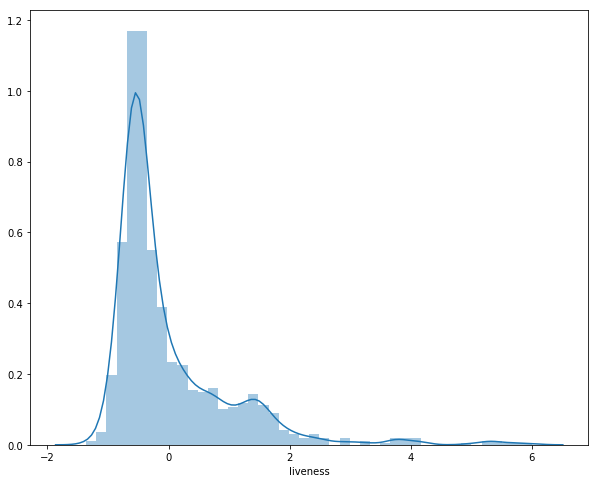

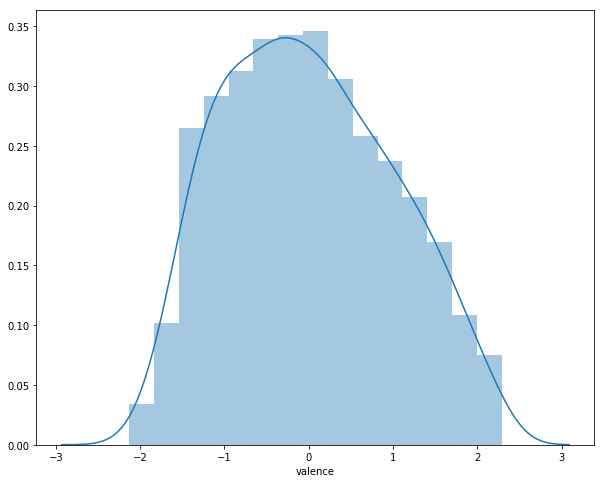

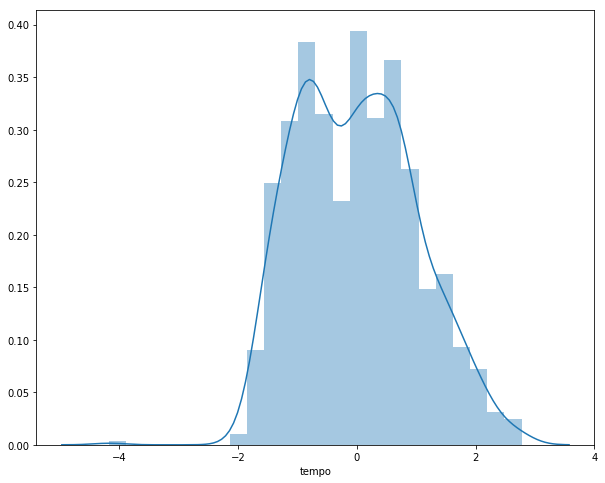

In [25]:
show_distribution(data_zs)

## 3.Normalization

In [26]:
data = df_bak
data_zs = preprocessing.normalize(data, norm='l2')
data_zs = pd.DataFrame(data_zs)
data_zs.columns=list(data.columns)

In [27]:
data_zs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 11 columns):
popularity      1000 non-null float64
danceability    1000 non-null float64
energy          1000 non-null float64
key             1000 non-null float64
loudness        1000 non-null float64
mode            1000 non-null float64
speechiness     1000 non-null float64
acousticness    1000 non-null float64
liveness        1000 non-null float64
valence         1000 non-null float64
tempo           1000 non-null float64
dtypes: float64(11)
memory usage: 86.0 KB


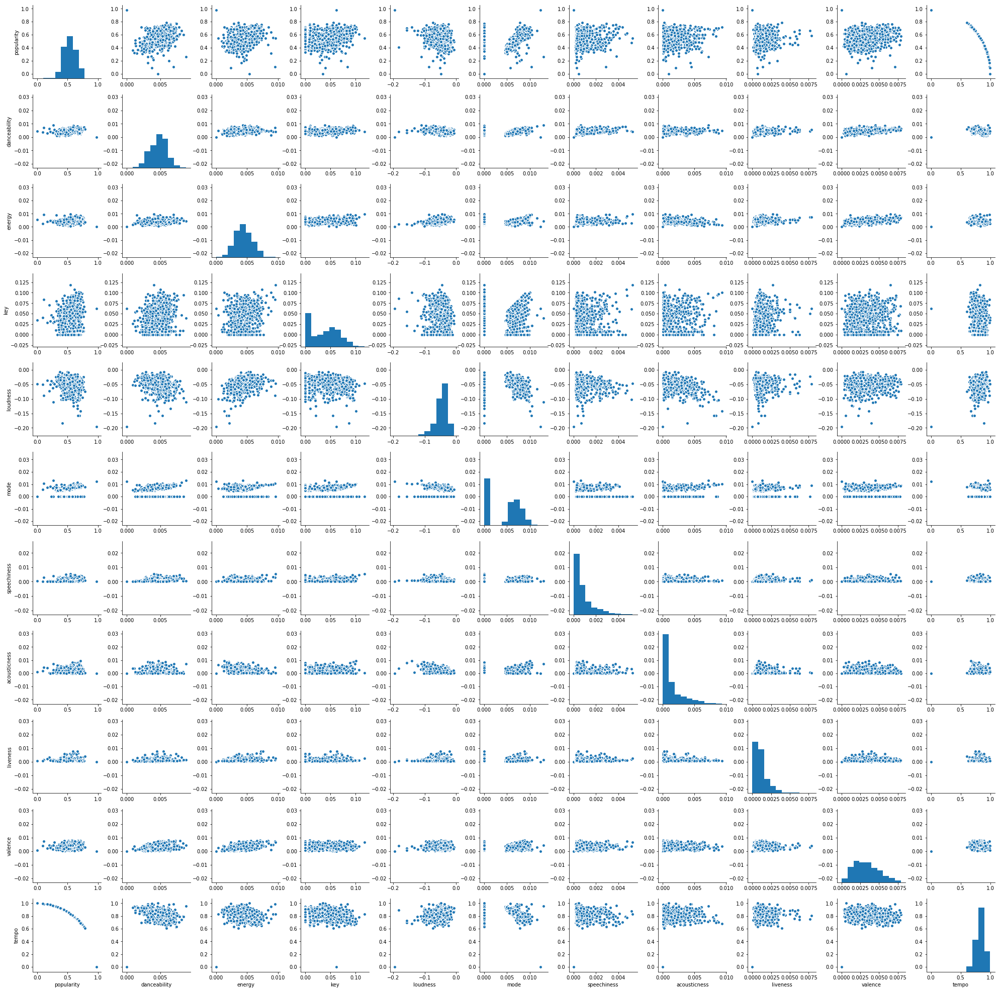

In [28]:
sns.pairplot(data_zs)

## Elbow method to determine the K value

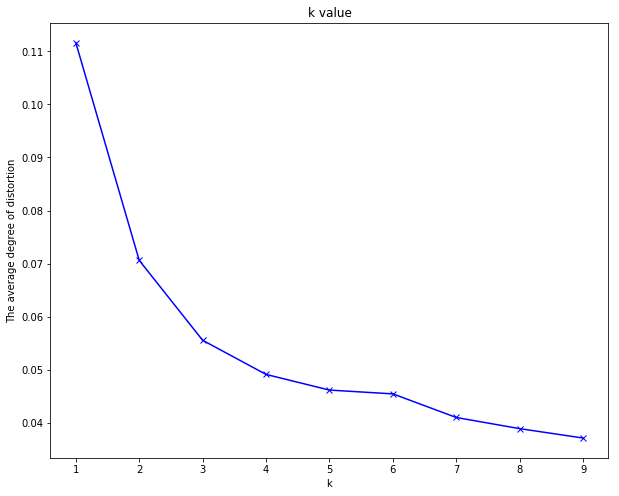

In [29]:
K = range(1, 10)  
meandistortions = [] 
for k in K:  
    kmeans = KMeans(n_clusters=k)  
    kmeans.fit(data_zs)  
    meandistortions.append(sum(np.min(cdist(data_zs, kmeans.cluster_centers_, 'euclidean'), axis=1)) / data_zs.shape[0])
plt.plot(K, meandistortions, 'bx-')  
plt.xlabel('k')  
plt.ylabel('The average degree of distortion')  
plt.title('k value'); 

## KMeans 
### k =2

In [30]:
model = KMeans(n_clusters = 2, n_jobs = 4,max_iter=500)
model.fit(data_zs)
labels = model.labels_
print(metrics.calinski_harabaz_score(data_zs,labels) )
print(metrics.silhouette_score(data_zs,labels,metric='euclidean'))

1464.05696295
0.517127036889


In [31]:
r1 = pd.Series(model.labels_).value_counts()
r2 = pd.DataFrame(model.cluster_centers_)
r = pd.concat([r2,r1],axis = 1)
r.columns = list(data_zs.columns)+["num"]
print(r)

   popularity  danceability    energy       key  loudness      mode  \
0    0.466850      0.004346  0.004162  0.034383 -0.042306  0.003950   
1    0.640495      0.005358  0.004958  0.043545 -0.053223  0.005049   

   speechiness  acousticness  liveness   valence     tempo  num  
0     0.000837      0.001190  0.001135  0.002995  0.878714  595  
1     0.000899      0.001672  0.001306  0.003789  0.759586  405  


Counter({0: 595, 1: 405})

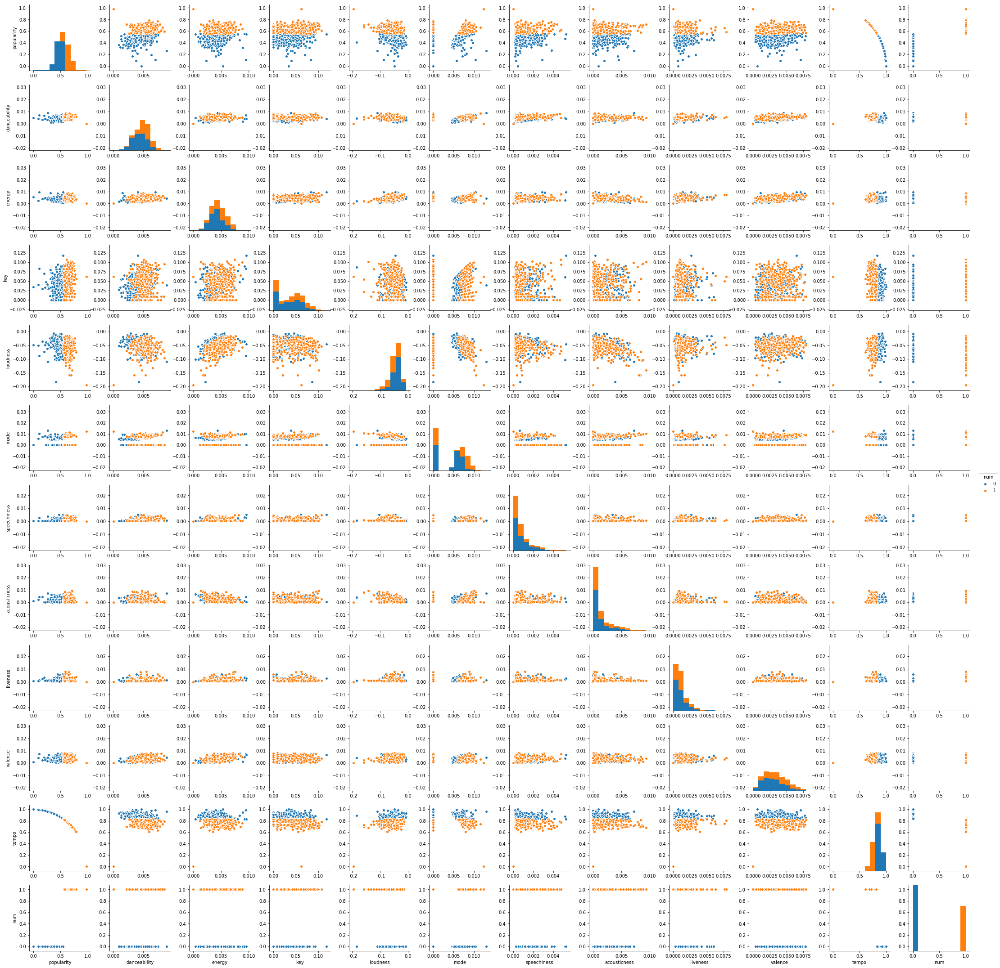

In [32]:
r = pd.concat([data_zs,pd.Series(model.labels_,index=data_zs.index)],axis=1)
r.columns=list(data_zs.columns)+["num"]
sns.pairplot(r,hue="num")
Counter(r['num'])

### k =3

In [33]:
model = KMeans(n_clusters = 3, n_jobs = 4,max_iter=500)
model.fit(data_zs)
labels = model.labels_
print(metrics.calinski_harabaz_score(data_zs,labels) )
print(metrics.silhouette_score(data_zs,labels,metric='euclidean'))

1424.62383088
0.442588766263


In [34]:
r1 = pd.Series(model.labels_).value_counts()
r2 = pd.DataFrame(model.cluster_centers_)
r = pd.concat([r2,r1],axis = 1)
r.columns = list(data.columns)+["num"]
print(r)

   popularity  danceability    energy       key  loudness      mode  \
0    0.662899      0.005454  0.005004  0.044217 -0.054962  0.005285   
1    0.409892      0.003801  0.003918  0.030705 -0.039853  0.004128   
2    0.530817      0.004879  0.004483  0.038548 -0.045372  0.003943   

   speechiness  acousticness  liveness   valence     tempo  num  
0     0.000965      0.001751  0.001273  0.003929  0.740596  299  
1     0.000847      0.001154  0.001147  0.002744  0.907824  274  
2     0.000801      0.001278  0.001194  0.003255  0.843761  427  


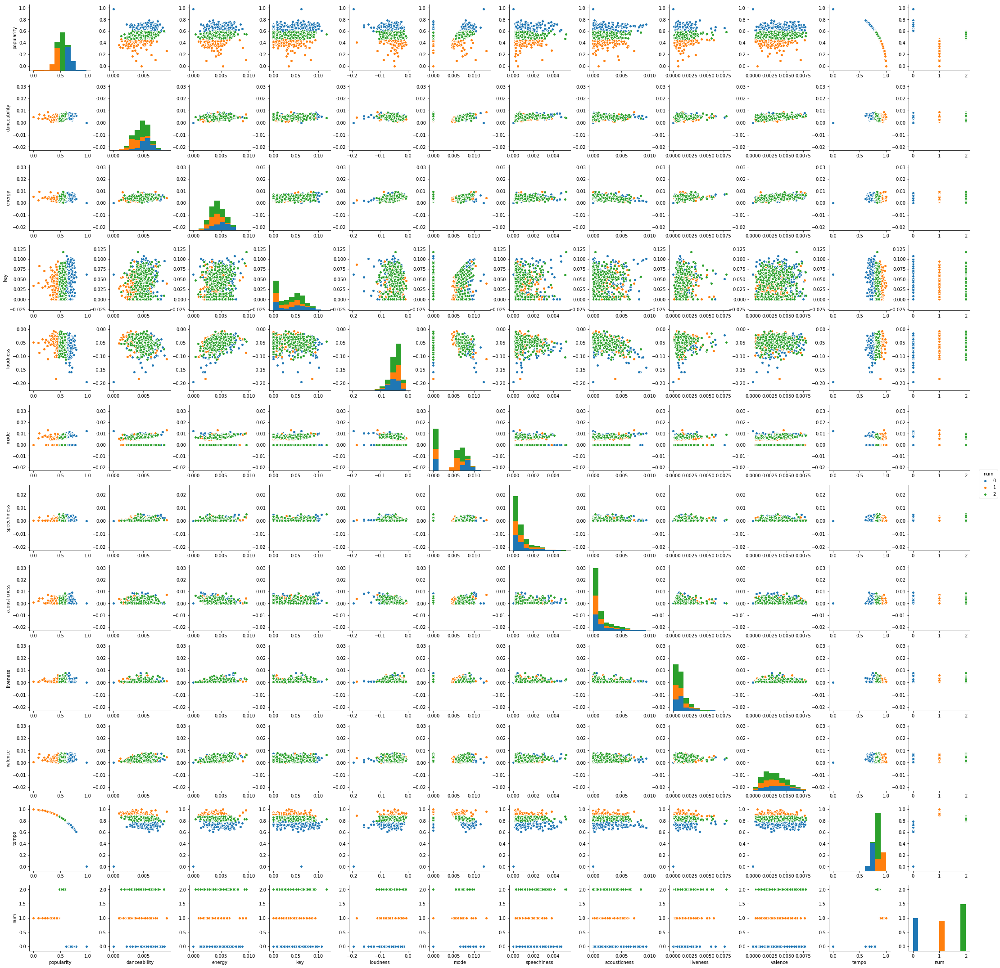

In [35]:
r = pd.concat([data_zs,pd.Series(model.labels_,index=data_zs.index)],axis=1)
r.columns=list(data_zs.columns)+["num"]
sns.pairplot(r,hue="num")

## DBSCAN
### eps = 0.02

In [36]:
db = DBSCAN(eps=0.02, min_samples=10).fit(data_zs)
labels = db.labels_
print(Counter(labels))

Counter({0: 765, -1: 235})


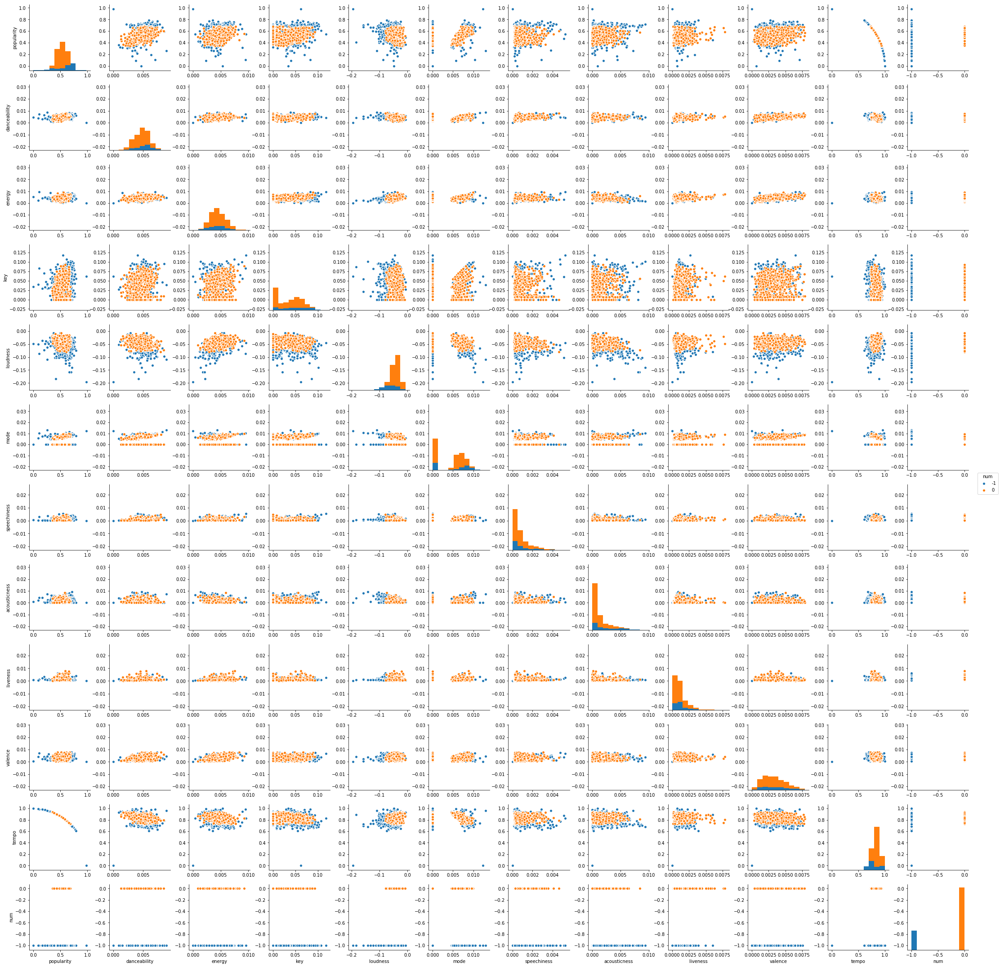

In [37]:
r = pd.concat([data_zs,pd.Series(labels,index=data_zs.index)],axis=1)
r.columns=list(data_zs.columns)+["num"]
sns.pairplot(r,hue="num")

### eps = 0.018

In [38]:
db = DBSCAN(eps=0.018, min_samples=20).fit(data_zs)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
print(Counter(labels))

Counter({-1: 576, 0: 358, 1: 66})


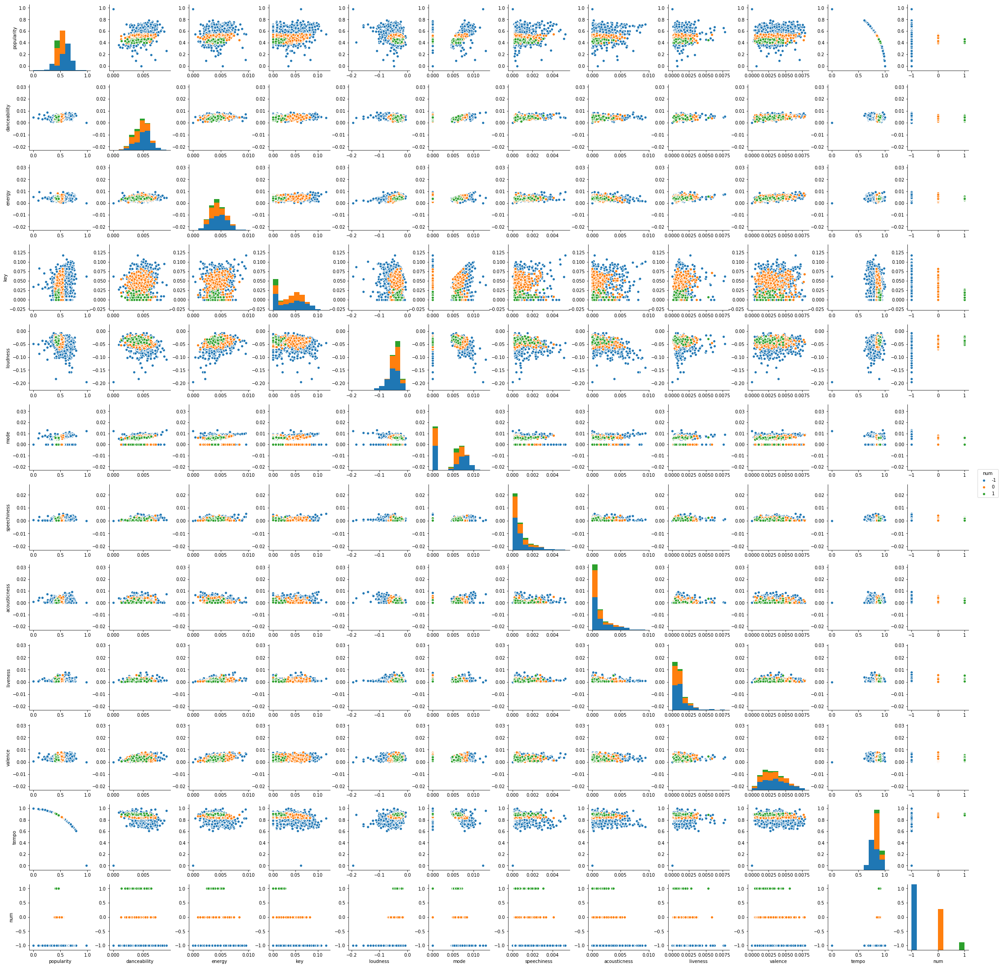

In [39]:
r = pd.concat([data_zs,pd.Series(labels,index=data_zs.index)],axis=1)
r.columns=list(data_zs.columns)+["num"]
sns.pairplot(r,hue="num")

## Mean-shift

In [40]:
bandwidth = estimate_bandwidth(data_zs, quantile=0.22, n_samples=500)
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(data_zs)
labels = ms.labels_
print(Counter(labels))

Counter({0: 954, 1: 39, 3: 3, 2: 2, 4: 1, 5: 1})


In [41]:
r1 = pd.Series(ms.labels_).value_counts()
r2 = pd.DataFrame(ms.cluster_centers_)
r = pd.concat([r2,r1],axis = 1)
r.columns = list(data.columns)+["num"]
print(r)

   popularity  danceability        energy       key  loudness      mode  \
0    0.498109      0.004623  4.259762e-03  0.035693 -0.042477  0.003846   
1    0.229674      0.004990  4.306393e-03  0.043205 -0.059593  0.006504   
2    0.097790      0.005384  5.912741e-03  0.061661 -0.069230  0.008065   
3    0.410603      0.004203  2.171872e-03  0.086443 -0.183669  0.000000   
4    0.978679      0.000000  2.490058e-07  0.061942 -0.195439  0.012388   
5    0.000000      0.004646  5.369870e-03  0.034159 -0.048308  0.000000   

   speechiness  acousticness  liveness   valence     tempo  num  
0     0.000813      0.001106  0.001157  0.003019  0.863849  954  
1     0.000783      0.001839  0.001795  0.003664  0.969277   39  
2     0.001574      0.003242  0.001026  0.005599  0.990346    2  
3     0.000683      0.003847  0.000817  0.003955  0.888901    3  
4     0.000000      0.000000  0.000000  0.000000  0.000000    1  
5     0.000465      0.000936  0.000724  0.000634  0.998222    1  


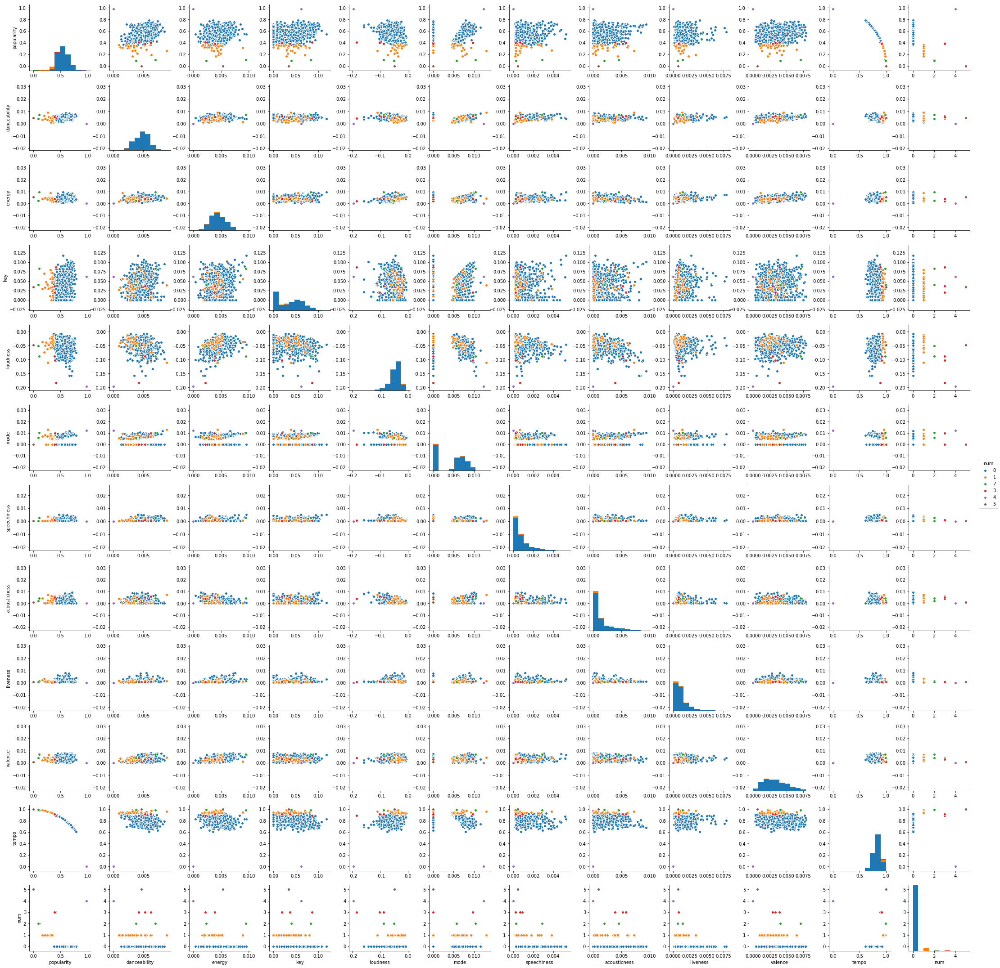

In [42]:
r = pd.concat([data_zs,pd.Series(labels,index=data_zs.index)],axis=1)
r.columns=list(data_zs.columns)+["num"]
sns.pairplot(r,hue="num")

### 1.Do the clustering methods generate the same clusters?
No, as you see from the figure above, you can see that they are differents, no matter you use k_means, DBScan, or Mean-shift, they generate the differents clusters.

### 2. Does scaling effect the clustering?
Yes, the sacling effect the clustering, as you can see from the figure above, when you sacling the data, the clustering becomes differents

### 3.Does the clustering produce interseting groupings?
Yes, when I finished clustering, the k_means method shows that the music id divided by two groups, and they are dependent by the value of "tempo","key" and "popularity"

# PartB.Generate a linear model for your data

In [43]:
data_zs.corr()

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,liveness,valence,tempo
popularity,1.000000,0.463411,0.265121,0.161861,-0.266996,0.125759,0.045341,0.109774,0.072111,0.244581,-0.952633
danceability,0.463411,1.000000,0.198715,0.052344,-0.238308,0.057964,0.225795,0.010738,0.059369,0.351243,-0.408272
energy,0.265121,0.198715,1.000000,0.133420,0.347651,0.061946,-0.017038,-0.273867,0.213109,0.499751,-0.226050
key,0.161861,0.052344,0.133420,1.000000,-0.120286,-0.100301,0.038735,0.103680,0.087349,0.064911,-0.186094
loudness,-0.266996,-0.238308,0.347651,-0.120286,1.000000,-0.157769,-0.170442,-0.466926,-0.028285,0.095723,0.342353
mode,0.125759,0.057964,0.061946,-0.100301,-0.157769,1.000000,-0.086388,0.139079,0.039753,0.027955,-0.151575
speechiness,0.045341,0.225795,-0.017038,0.038735,-0.170442,-0.086388,1.000000,0.029246,0.102696,-0.012347,-0.054373
acousticness,0.109774,0.010738,-0.273867,0.103680,-0.466926,0.139079,0.029246,1.000000,-0.017003,0.010780,-0.128154
liveness,0.072111,0.059369,0.213109,0.087349,-0.028285,0.039753,0.102696,-0.017003,1.000000,0.059699,-0.068949
valence,0.244581,0.351243,0.499751,0.064911,0.095723,0.027955,-0.012347,0.010780,0.059699,1.000000,-0.227056


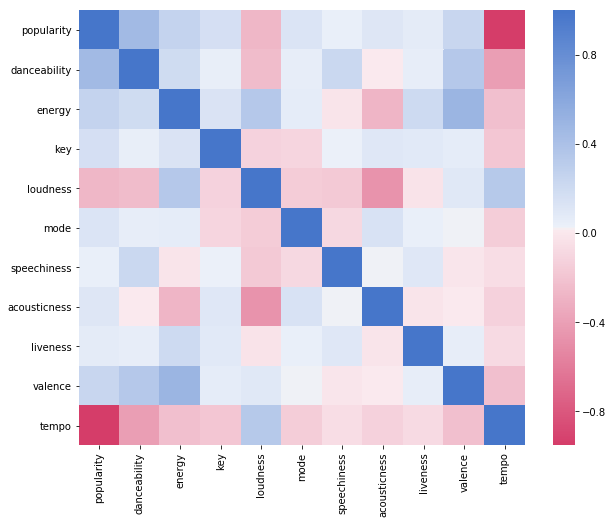

In [44]:
cmap = sns.diverging_palette(0, 255, sep=1, n=256, as_cmap=True)
sns.heatmap(data_zs.corr(), cmap=cmap)

In [45]:
x = data_zs[["tempo"]]
y = data_zs[["popularity"]]
#plt.scatter(x,y)
model=linear_model.LinearRegression()
results = model.fit(x,y)
print(results.intercept_, results.coef_)


[ 1.67679514] [[-1.37226205]]


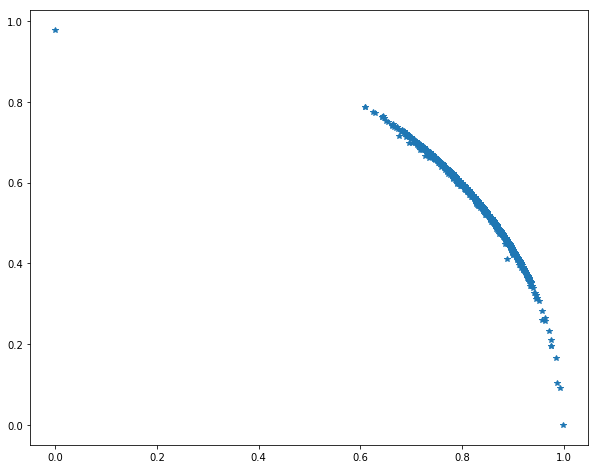

In [46]:
plt.plot(x,y,"*")

                            OLS Regression Results                            
Dep. Variable:             popularity   R-squared:                       0.908
Model:                            OLS   Adj. R-squared:                  0.907
Method:                 Least Squares   F-statistic:                     9792.
Date:                Fri, 16 Feb 2018   Prob (F-statistic):               0.00
Time:                        23:33:04   Log-Likelihood:                 2009.3
No. Observations:                1000   AIC:                            -4015.
Df Residuals:                     998   BIC:                            -4005.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.6768      0.012    145.024      0.0

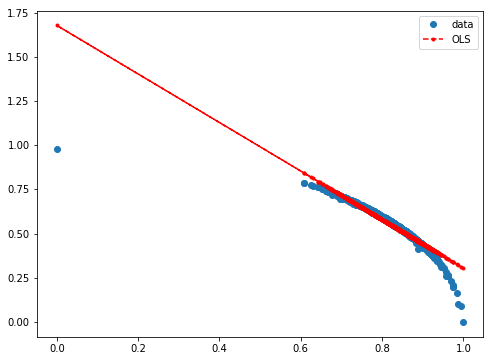

In [47]:
x = data_zs["tempo"]
X = sm.add_constant(x)
y = data_zs["popularity"]
model = sm.OLS(y,X)
results = model.fit()
print(results.summary())
y_fitted =results.fittedvalues
fig, ax = plt.subplots(figsize=(8,6))
ax.plot(x, y, 'o', label='data')
ax.plot(x, y_fitted, 'r--.',label='OLS')
ax.legend(loc='best')


In [48]:
x = data_zs[["tempo","danceability"]]
X = sm.add_constant(x)
y = data_zs["popularity"]
model = sm.OLS(y,X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             popularity   R-squared:                       0.914
Model:                            OLS   Adj. R-squared:                  0.914
Method:                 Least Squares   F-statistic:                     5309.
Date:                Fri, 16 Feb 2018   Prob (F-statistic):               0.00
Time:                        23:33:05   Log-Likelihood:                 2046.7
No. Observations:                1000   AIC:                            -4087.
Df Residuals:                     997   BIC:                            -4073.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            1.5968      0.014    110.982      0.000       1.569       1.625
tempo           -1.3197      0.015    -90.133      0.000      -1.348      -1.291
danceability     7.6475      0.870      8.793      0.000       5.941       9.354
==============================================================================
Omnibus:                     1659.646   Durbin-Watson:                   1.954
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1221408.297
Skew:                         -10.345   Prob(JB):                         0.00
Kurtosis:                     172.958   Cond. No.                     1.14e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.14e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [49]:
x = data_zs[["tempo","danceability","loudness"]]
X = sm.add_constant(x)
y = data_zs["popularity"]
model = sm.OLS(y,X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             popularity   R-squared:                       0.919
Model:                            OLS   Adj. R-squared:                  0.919
Method:                 Least Squares   F-statistic:                     3790.
Date:                Fri, 16 Feb 2018   Prob (F-statistic):               0.00
Time:                        23:33:05   Log-Likelihood:                 2078.6
No. Observations:                1000   AIC:                            -4149.
Df Residuals:                     996   BIC:                            -4129.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            1.6392      0.015    110.050      0.000       1.610       1.668
tempo           -1.3527      0.015    -91.619      0.000      -1.382      -1.324
danceability     8.4366      0.848      9.943      0.000       6.772      10.102
loudness         0.4006      0.049      8.096      0.000       0.304       0.498
==============================================================================
Omnibus:                     1595.725   Durbin-Watson:                   1.947
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           991593.567
Skew:                          -9.584   Prob(JB):                         0.00
Kurtosis:                     156.071   Cond. No.                     1.15e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.15e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [50]:
x = data_zs[["tempo","danceability","loudness","energy"]]
X = sm.add_constant(x)
y = data_zs["popularity"]
model = sm.OLS(y,X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             popularity   R-squared:                       0.920
Model:                            OLS   Adj. R-squared:                  0.919
Method:                 Least Squares   F-statistic:                     2842.
Date:                Fri, 16 Feb 2018   Prob (F-statistic):               0.00
Time:                        23:33:05   Log-Likelihood:                 2078.9
No. Observations:                1000   AIC:                            -4148.
Df Residuals:                     995   BIC:                            -4123.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            1.6326      0.017     95.983      0.000       1.599       1.666
tempo           -1.3488      0.016    -86.640      0.000      -1.379      -1.318
danceability     8.2994      0.866      9.589      0.000       6.601       9.998
loudness         0.3785      0.057      6.689      0.000       0.267       0.490
energy           0.6552      0.813      0.806      0.420      -0.940       2.250
==============================================================================
Omnibus:                     1592.752   Durbin-Watson:                   1.946
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           972699.156
Skew:                          -9.555   Prob(JB):                         0.00
Kurtosis:                     154.590   Cond. No.                     1.25e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.25e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [51]:
x = data_zs[["tempo","danceability","loudness","energy","valence"]]
X = sm.add_constant(x)
y = data_zs["popularity"]
model = sm.OLS(y,X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             popularity   R-squared:                       0.920
Model:                            OLS   Adj. R-squared:                  0.919
Method:                 Least Squares   F-statistic:                     2279.
Date:                Fri, 16 Feb 2018   Prob (F-statistic):               0.00
Time:                        23:33:05   Log-Likelihood:                 2080.5
No. Observations:                1000   AIC:                            -4149.
Df Residuals:                     994   BIC:                            -4120.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            1.6325      0.017     96.087      0.000       1.599       1.666
tempo           -1.3496      0.016    -86.755      0.000      -1.380      -1.319
danceability     8.7297      0.897      9.735      0.000       6.970      10.489
loudness         0.3800      0.057      6.721      0.000       0.269       0.491
energy           1.3117      0.889      1.475      0.141      -0.434       3.057
valence         -1.2578      0.696     -1.807      0.071      -2.624       0.108
==============================================================================
Omnibus:                     1597.056   Durbin-Watson:                   1.933
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           985761.578
Skew:                          -9.605   Prob(JB):                         0.00
Kurtosis:                     155.608   Cond. No.                     1.32e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.32e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [52]:
model = KMeans(n_clusters = 2, n_jobs = 4,max_iter=500)
model.fit(data_zs)
labels = model.labels_
r = pd.concat([data_zs,pd.Series(model.labels_,index=data_zs.index)],axis=1)
r.columns=list(data.columns)+["num"]
print(r)


     popularity  danceability    energy       key  loudness      mode  \
0      0.788199      0.005935  0.003578  0.055174 -0.074784  0.007882   
1      0.715806      0.004375  0.003272  0.058433 -0.046104  0.007304   
2      0.681080      0.004893  0.005970  0.034749 -0.033894  0.000000   
3      0.681949      0.005323  0.003639  0.013917 -0.030152  0.006959   
4      0.510530      0.003117  0.002854  0.026870 -0.035635  0.000000   
5      0.639610      0.005084  0.004589  0.059345 -0.041265  0.000000   
6      0.653638      0.005515  0.005011  0.015026 -0.037535  0.007513   
7      0.427102      0.004048  0.004053  0.009933 -0.027186  0.004966   
8      0.527648      0.003534  0.004304  0.054963 -0.035495  0.005496   
9      0.587574      0.004612  0.005029  0.000000 -0.024623  0.006832   
10     0.463877      0.003184  0.004354  0.000000 -0.025323  0.005271   
11     0.518907      0.003782  0.004157  0.028828 -0.032662  0.000000   
12     0.579116      0.005135  0.003745  0.064346 -

### 1.Is the relationship significant?
Yes, whe I use five attributes "tempo","danceability","loudness","energy","valence" to to the Linear Regression, the model's R-squared is 0.925, and the P-values of all the five attributes is lower than 0.05, which means the relationship is significant

### 2. Are any model assumptions violated?

In [53]:
import statsmodels.api as sm
import scipy.stats as scipystats
x = data_zs[["tempo","danceability","loudness","energy","valence"]]
X = sm.add_constant(x)
y = data_zs["popularity"]
model = sm.OLS(y,X).fit()
model.summary()
aa =pd.Series(model.resid, name = 'resid')

#### Tests for Normality of Residuals

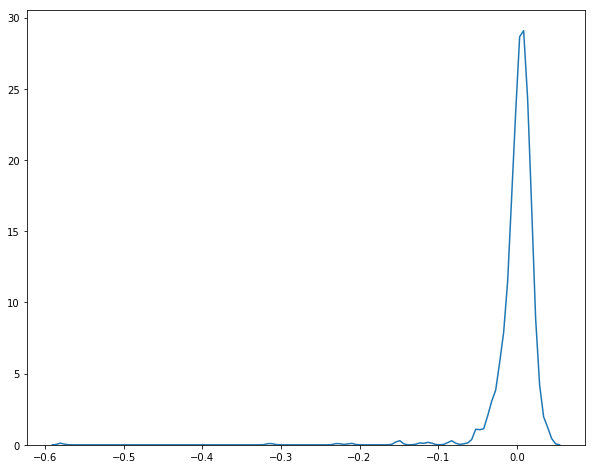

In [54]:
sns.distplot(np.array(aa), hist=False)


In [55]:
scipystats.probplot(aa, dist="norm")
plt.show()
norm_resid = (aa - np.mean(aa)) / np.std(aa)
print(scipystats.kstest(norm_resid, 'norm'))

KstestResult(statistic=0.18816500864188218, pvalue=0.0)


Since the p-value is lower than 0.05, we can see that residual is not normal distirbution.So it has assumptions violated

### 3 Is there any multi-colinearity in the model
We can use the vif option to check for multicollinearity. vif stands for variance inflation factor. As a rule of thumb, a variable whose VIF values is greater than 10 may merit further investigation. Tolerance, defined as 1/VIF, is used by many researchers to check on the degree of collinearity. A tolerance value lower than 0.1 is comparable to a VIF of 10. It means that the variable could be considered as a linear combination of other independent variables

In [56]:
from patsy import dmatrices
from statsmodels.stats.outliers_influence import variance_inflation_factor
y, X = dmatrices("popularity ~ tempo + danceability + loudness + energy + valence", data = data_zs, return_type = "dataframe")
vif = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print (vif)

[314.30030821783618, 1.4450912825032391, 1.3609702781723632, 1.5009473636828703, 1.6775006473175946, 1.4628573764533239]


### 4.In the multiple regression models are predictor variables independent of all the other predictor variables?

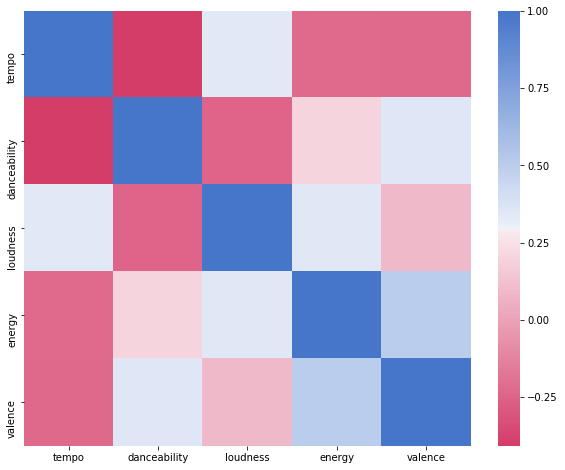

In [57]:
cmap = sns.diverging_palette(0, 255, sep=1, n=256, as_cmap=True)
X = data_zs[["tempo","danceability","loudness","energy","valence"]]
sns.heatmap(X.corr(), cmap=cmap)

we can see that the predictor variables are not independent of all other predictor variables

### 5. Does the model make sense?
I don't know now


### 6.Cross-validate the model. How well did it do?  

## Cross-validation

In [58]:
X = data_zs[["tempo","danceability","loudness","energy","valence"]]
y = data_zs["popularity"]
X=np.array(X)
y=np.array(y)
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=0)
clf = LinearRegression()
scores = cross_val_score(clf, X_test, y_test, cv=6)
print(scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))


[ 0.96261307  0.96719763  0.96854548  0.91339103  0.89413788  0.95601857]
Accuracy: 0.94 (+/- 0.06)


## K-Fold cross-validator

In [59]:
kf = KFold(len(X),n_folds=5)
scores=[]
for train ,test in kf:
    clf = LinearRegression()
    clf.fit(X[train],y[train])
    scores.append(np.sqrt(metrics.mean_squared_error(y[test],clf.predict(X[test]))))
scores


[0.019289451786932543,
 0.018906913253222295,
 0.018988836707576413,
 0.056769248932564298,
 0.041037336524352541]

The accuracy is about 96%, so it fit well

### 7.Does regularization help with creating models that validate better on out of sample data

Text(0.5,1,'Ridge Regression - popularity vs Predicted popularity: $Y_i$ vs $\\hat{y}_i$')

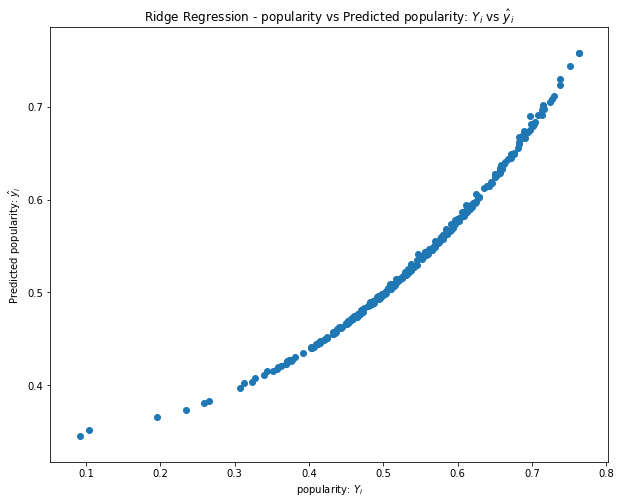

In [60]:
ridge = Ridge(fit_intercept=True, alpha=0.5)
ridge.fit(X_train,y_train)
y_pred = ridge.predict(X_test)
plt.scatter(y_test, y_pred)
plt.rcParams['figure.figsize'] = (10, 6)
plt.xlabel("popularity: $Y_i$")
plt.ylabel("Predicted popularity: $\hat{y}_i$")
plt.title("Ridge Regression - popularity vs Predicted popularity: $Y_i$ vs $\hat{y}_i$")

In [61]:
rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
rmse

0.035197961458600692

In [62]:
kf = KFold(len(X),n_folds=5)
scores=[]
for train ,test in kf:
    clf = LinearRegression()
    clf.fit(X[train],y[train])
    scores.append(np.sqrt(metrics.mean_squared_error(y[test],clf.predict(X[test]))))
scores

[0.019289451786932543,
 0.018906913253222295,
 0.018988836707576413,
 0.056769248932564298,
 0.041037336524352541]

In [63]:
print('Ridge Regression',rmse ,np.mean(scores))

Ridge Regression 0.0351979614586 0.0309983574409


So in this model the regularization do not help creating model that validate better

# Part C: Generate a logistic model

# Checking that the target variable is binary

Since we are building a model to predict the modality (major or minor) of a track, our target is going to be "Whether is mode" variable from the billboard dataframe. To make sure that it's a binary variable,Let's use Seaborn's countplot() function

In [64]:
data = df_bak
#print(data)
data_zs = preprocessing.normalize(data, norm='l2')
data_zs = pd.DataFrame(data_zs)
data_zs.columns=list(data.columns)
aa = df_bak["mode"].tolist()
data_zs["mode"] = aa

#print(data_zs)

In [65]:
#data_zs.dropna(inplace=True)
data_zs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 11 columns):
popularity      1000 non-null float64
danceability    1000 non-null float64
energy          1000 non-null float64
key             1000 non-null float64
loudness        1000 non-null float64
mode            1000 non-null int64
speechiness     1000 non-null float64
acousticness    1000 non-null float64
liveness        1000 non-null float64
valence         1000 non-null float64
tempo           1000 non-null float64
dtypes: float64(10), int64(1)
memory usage: 86.0 KB


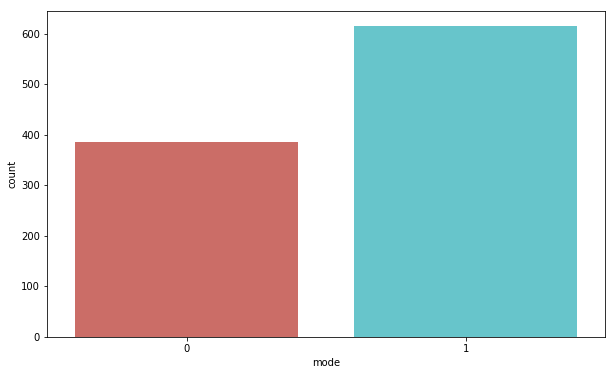

In [66]:
sns.countplot(x='mode',data=data_zs, palette='hls')

And we see that the "mode" variable is binary(Major is represented by 1 and minor is 0)

In [67]:
data_zs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 11 columns):
popularity      1000 non-null float64
danceability    1000 non-null float64
energy          1000 non-null float64
key             1000 non-null float64
loudness        1000 non-null float64
mode            1000 non-null int64
speechiness     1000 non-null float64
acousticness    1000 non-null float64
liveness        1000 non-null float64
valence         1000 non-null float64
tempo           1000 non-null float64
dtypes: float64(10), int64(1)
memory usage: 86.0 KB


In [68]:
data_zs.isnull().sum()

popularity      0
danceability    0
energy          0
key             0
loudness        0
mode            0
speechiness     0
acousticness    0
liveness        0
valence         0
tempo           0
dtype: int64

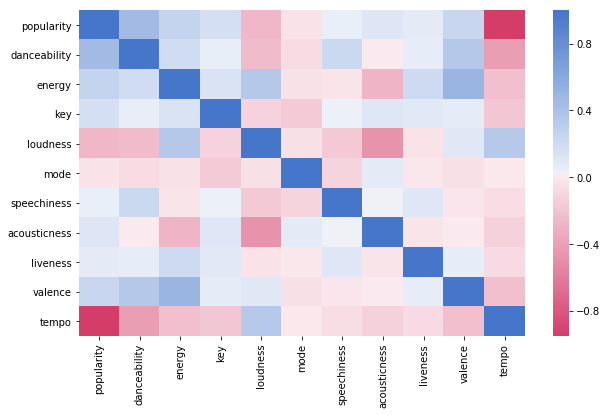

In [69]:
cmap = sns.diverging_palette(0, 255, sep=1, n=256, as_cmap=True)
sns.heatmap(data_zs.corr(), cmap=cmap)

In [70]:
data_zs['intercept']=1.0

In [71]:
pred=["tempo","danceability","loudness","energy","valence","intercept","key","speechiness","acousticness","liveness"]

In [72]:
L_model =sm.Logit(data_zs['mode'],data_zs[pred]).fit()

Optimization terminated successfully.
         Current function value: 0.638763
         Iterations 6


In [73]:
L_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                   mode   No. Observations:                 1000
Model:                          Logit   Df Residuals:                      990
Method:                           MLE   Df Model:                            9
Date:                Fri, 16 Feb 2018   Pseudo R-squ.:                 0.04156
Time:                        23:33:12   Log-Likelihood:                -638.76
converged:                       True   LL-Null:                       -666.46
                                        LLR p-value:                 1.025e-08
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
tempo           -0.4048      1.146     -0.353      0.724      -2.652       1.842
danceability   -86.9019     66.659     -1.304      0.192    -217.551      43.747
loudness        -7.9193      4.517     -1.753      0.080     -16.773       0.934
energy          87.4366     66.384      1.317      0.188     -42.673     217.546
valence        -52.0219     49.953     -1.041      0.298    -149.928      45.884
intercept        1.2633      1.255      1.007      0.314      -1.196       3.723
key            -14.5757      2.610     -5.585      0.000     -19.691      -9.461
speechiness   -277.1445     83.189     -3.331      0.001    -440.192    -114.097
acousticness   108.7505     48.583      2.238      0.025      13.530     203.971
liveness        29.9146     75.681      0.395      0.693    -118.418     178.247
================================================================================
"""

In [74]:
pred=["loudness","valence","intercept","key","acousticness",]
L_model =sm.Logit(data_zs['mode'],data_zs[pred]).fit()
L_model.summary()

Optimization terminated successfully.
         Current function value: 0.647423
         Iterations 6


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                   mode   No. Observations:                 1000
Model:                          Logit   Df Residuals:                      995
Method:                           MLE   Df Model:                            4
Date:                Fri, 16 Feb 2018   Pseudo R-squ.:                 0.02856
Time:                        23:33:12   Log-Likelihood:                -647.42
converged:                       True   LL-Null:                       -666.46
                                        LLR p-value:                 1.083e-07
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
loudness        -2.5959      3.698     -0.702      0.483      -9.843       4.651
valence        -36.3135     40.241     -0.902      0.367    -115.185      42.557
intercept        0.8508      0.233      3.650      0.000       0.394       1.308
key            -13.5758      2.508     -5.412      0.000     -18.492      -8.659
acousticness   110.6895     46.277      2.392      0.017      19.988     201.391
================================================================================
"""

In [75]:
pred=["intercept","key","acousticness",]
L_model =sm.Logit(data_zs['mode'],data_zs[pred]).fit()
L_model.summary()

Optimization terminated successfully.
         Current function value: 0.648161
         Iterations 5


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                   mode   No. Observations:                 1000
Model:                          Logit   Df Residuals:                      997
Method:                           MLE   Df Model:                            2
Date:                Fri, 16 Feb 2018   Pseudo R-squ.:                 0.02746
Time:                        23:33:12   Log-Likelihood:                -648.16
converged:                       True   LL-Null:                       -666.46
                                        LLR p-value:                 1.130e-08
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
intercept        0.8305      0.126      6.606      0.000       0.584       1.077
key            -13.5484      2.488     -5.446      0.000     -18.424      -8.672
acousticness   124.5942     41.578      2.997      0.003      43.103     206.085
================================================================================
"""

### 1.Is the relationship significant?
Since the p-value of "key" and "acousticness" are lower than 0.05, so the relationship is significant

### 2.Are any model assumptions violated

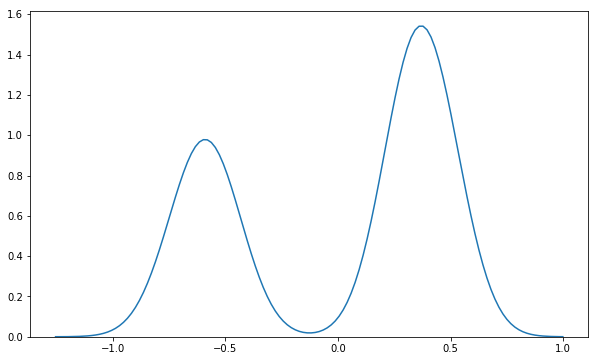

KstestResult(statistic=0.26950025954266627, pvalue=0.0)


In [76]:
import statsmodels.api as sm
import scipy.stats as scipystats
x = data_zs[["key","acousticness"]]
X = sm.add_constant(x)
y = data_zs["mode"]
model = sm.OLS(y,X).fit()
model.summary()
aa =pd.Series(model.resid, name = 'resid')
sns.distplot(np.array(aa), hist=False)
scipystats.probplot(aa, dist="norm")
plt.show()
norm_resid = (aa - np.mean(aa)) / np.std(aa)
print(scipystats.kstest(norm_resid, 'norm'))

Since the p-value is lower than 0.05, we can see that residual is not normal distirbution.So it has assumptions violated

###  3.Cross-validate the model. How well did it do

In [77]:
data = df_bak
#print(data)
data_zs = preprocessing.normalize(data, norm='l2')
data_zs = pd.DataFrame(data_zs)
data_zs.columns=list(data.columns)
aa = df_bak["mode"].tolist()
data_zs["mode"] = aa
X = data_zs[["key","acousticness"]]
y = data_zs["mode"]
X=np.array(X)
y=np.array(y)
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=0)
clf = LogisticRegression()
clf.fit(X_train, y_train)
scores = cross_val_score(clf, X_test, y_test, cv=6)
print(scores)
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

[ 0.62745098  0.62745098  0.62745098  0.63265306  0.63265306  0.63265306]
Accuracy: 0.63 (+/- 0.01)


The Accuracy is noly 59%